# ***ENERGY CONSUMPTION FORECASTING***

# ***PROBLEM STATEMENT***
 Accurate forecasting of energy consumption is essential to reduce cost,prevent energy wastage,and enable sustainable power management

# ***Importing required libraries***


In [ ]:
import numpy as np
import pandas as pd
import pandas as df # Corrected typo: 'dataframe' changed to 'pandas'
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from datetime import datetime
import joblib
from sklearn.cluster import KMeans

# ***Dataset Overview***

# 1.Dataset Name:Energy Consumption Forecasting
# 2.source:https://www.kaggle.com/datasets/taruneshburman/energy-consumption-forecasting
# 3.FileFormat:csv

In [ ]:
import pandas as pd
import pandas as df # Corrected typo: 'dataframe' changed to 'pandas'

In [ ]:
import pandas as pd
df=pd.read_csv('/content/sample_data/Energy_Consumption_Forecasting.csv')

In [ ]:
df.head()

,Solar Irradiance (kWh/m²),Average Temperature (°C),Wind Speed (m/s),Humidity (%),Cloud Cover (%),Atmospheric Pressure (hPa),Daily Sunshine Duration (hours),Panel Orientation (degrees),System Efficiency (%),Type of Renewable System,Energy Consumption Category
0,3.745401,-0.743354,3.925585,70.543269,57.199588,989.363552,7.779083,13.967804,74.824113,Solar,1
1,9.507143,17.095047,3.704682,81.701326,80.543233,997.343566,2.068636,67.238110,71.855470,Wind,2
2,7.319939,33.647292,13.593819,32.542111,76.016093,1035.454739,10.468735,299.248490,18.617878,Solar,1
3,5.986585,26.611244,3.743193,66.238669,15.389990,984.000439,7.357395,276.036608,93.031516,Wind,2
4,1.560186,30.328057,4.079246,61.457138,14.924947,1036.964968,1.886447,126.231369,61.162498,Solar,1


In [ ]:
df.describe()

,Solar Irradiance (kWh/m²),Average Temperature (°C),Wind Speed (m/s),Humidity (%),Cloud Cover (%),Atmospheric Pressure (hPa),Daily Sunshine Duration (hours),Panel Orientation (degrees),System Efficiency (%),Energy Consumption Category,cluster
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,4.902566,15.350865,7.536086,54.133754,49.410532,999.846449,5.919706,173.653422,53.784702,1.084000,0.935000
std,2.921374,14.609495,4.360113,25.784041,28.680994,28.919481,3.476804,102.569183,25.401107,0.830442,0.797126
min,0.046320,-9.839087,0.000175,10.058805,0.003072,950.618382,0.017140,0.086762,10.021864,0.000000,0.000000
25%,2.359733,2.053714,3.920265,31.771069,24.497401,974.938000,2.882660,84.956145,32.444534,0.000000,0.000000
50%,4.968074,15.936695,7.509209,53.585136,49.459810,999.040282,5.815716,174.236651,53.083086,1.000000,1.000000
75%,7.443196,28.023253,11.386553,76.378673,73.999345,1023.985178,9.077572,257.207850,74.431448,2.000000,2.000000
max,9.997177,39.970686,14.967313,99.960193,99.774939,1049.935030,11.993528,359.605692,99.641150,2.000000,2.000000


In [ ]:
df.shape

(1000, 11)

In [ ]:
df.columns

Index(['Solar Irradiance (kWh/m²)', 'Average Temperature (°C)',
       'Wind Speed (m/s)', 'Humidity (%)', 'Cloud Cover (%)',
       'Atmospheric Pressure (hPa)', 'Daily Sunshine Duration (hours)',
       'Panel Orientation (degrees)', 'System Efficiency (%)',
       'Type of Renewable System', 'Energy Consumption Category'],
      dtype='object')

In [ ]:
x= df[['Energy Consumption Category']]

In [ ]:
df.isnull().sum()

,0
Solar Irradiance (kWh/m²),0
Average Temperature (°C),0
Wind Speed (m/s),0
Humidity (%),0
Cloud Cover (%),0
Atmospheric Pressure (hPa),0
Daily Sunshine Duration (hours),0
Panel Orientation (degrees),0
System Efficiency (%),0
Type of Renewable System,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Solar Irradiance (kWh/m²)        1000 non-null   float64
 1   Average Temperature (°C)         1000 non-null   float64
 2   Wind Speed (m/s)                 1000 non-null   float64
 3   Humidity (%)                     1000 non-null   float64
 4   Cloud Cover (%)                  1000 non-null   float64
 5   Atmospheric Pressure (hPa)       1000 non-null   float64
 6   Daily Sunshine Duration (hours)  1000 non-null   float64
 7   Panel Orientation (degrees)      1000 non-null   float64
 8   System Efficiency (%)            1000 non-null   float64
 9   Type of Renewable System         1000 non-null   object 
 10  Energy Consumption Category      1000 non-null   int64  
dtypes: float64(9), int64(1), object(1)
memory usage: 86.1+ KB


In [ ]:
df.shape

(1000, 11)

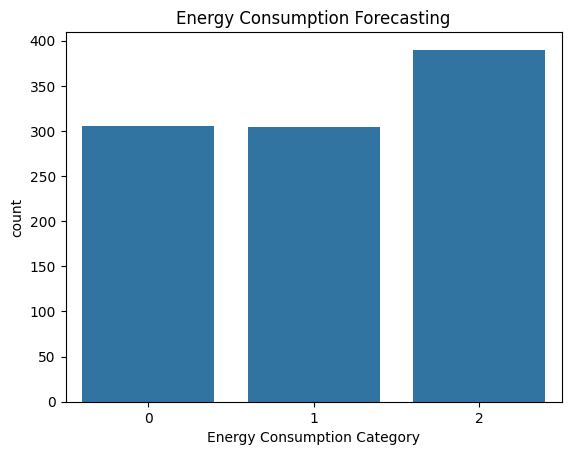

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x='Energy Consumption Category', data=df)
plt.title('Energy Consumption Forecasting')
plt.show()

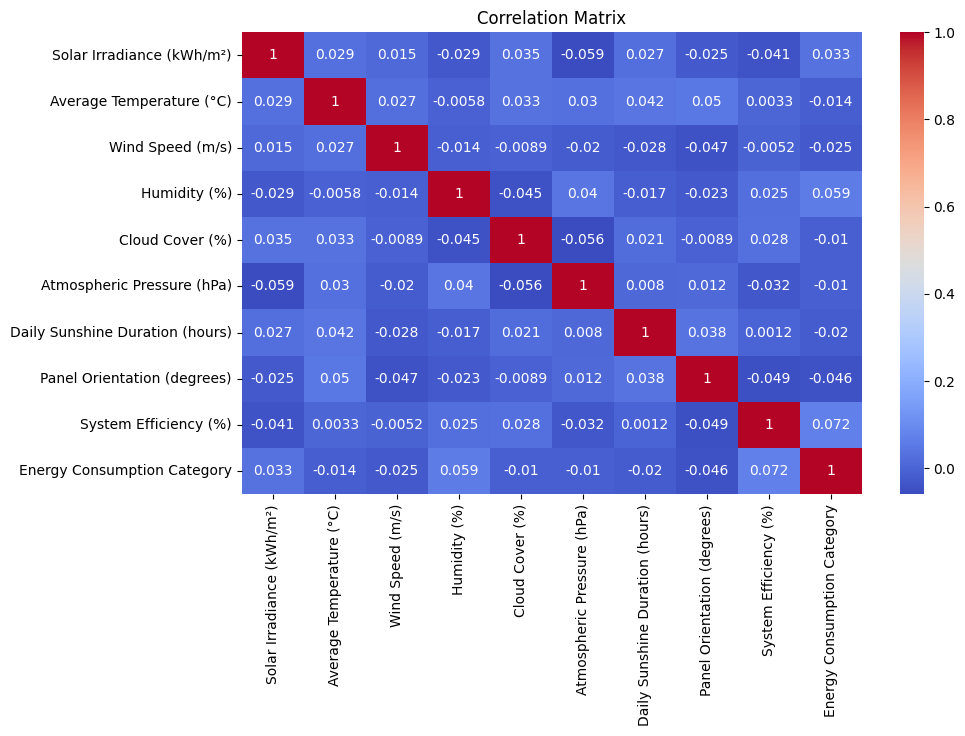

In [ ]:
plt.figure(figsize=(10,6))
sns.heatmap(df.drop('Type of Renewable System', axis=1).corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

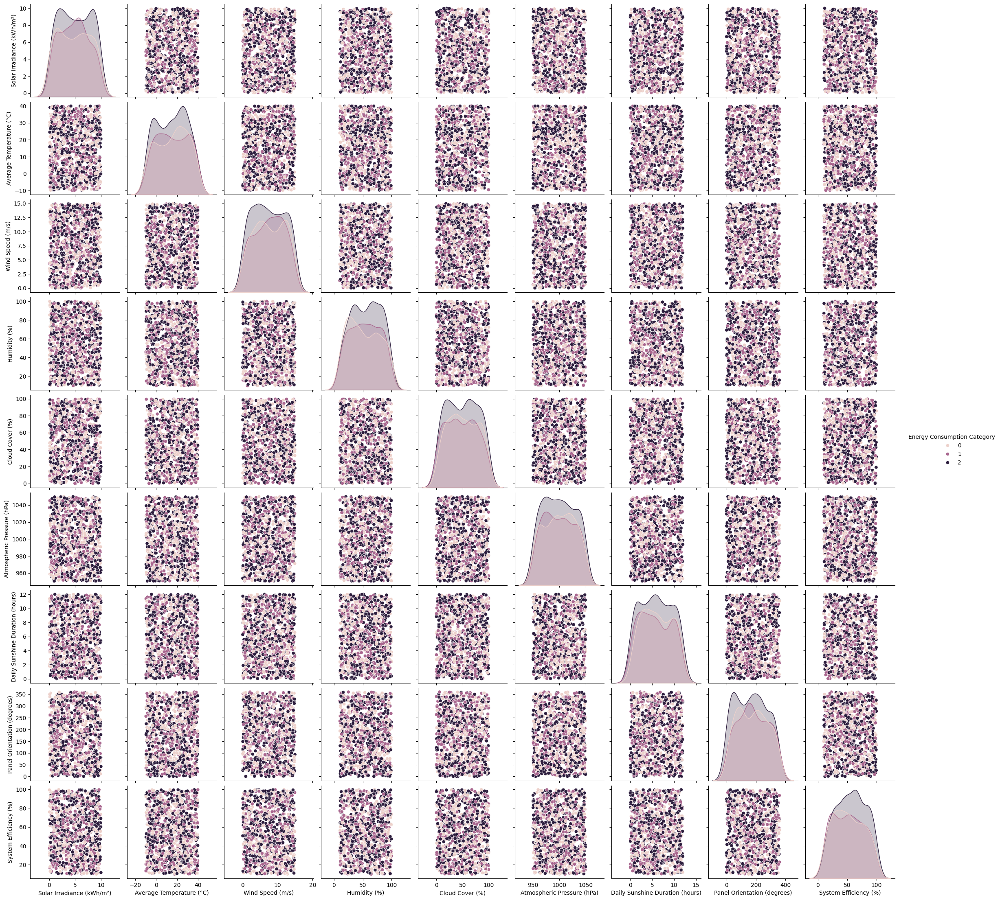

In [ ]:
sns.pairplot(df, hue='Energy Consumption Category')
plt.show()

In [ ]:
print(df.columns)

Index(['Solar Irradiance (kWh/m²)', 'Average Temperature (°C)',
       'Wind Speed (m/s)', 'Humidity (%)', 'Cloud Cover (%)',
       'Atmospheric Pressure (hPa)', 'Daily Sunshine Duration (hours)',
       'Panel Orientation (degrees)', 'System Efficiency (%)',
       'Type of Renewable System', 'Energy Consumption Category'],
      dtype='object')


In [ ]:
x=df.drop('Energy Consumption Category',axis=1)
y=df['Energy Consumption Category']

In [ ]:
x

,Solar Irradiance (kWh/m²),Average Temperature (°C),Wind Speed (m/s),Humidity (%),Cloud Cover (%),Atmospheric Pressure (hPa),Daily Sunshine Duration (hours),Panel Orientation (degrees),System Efficiency (%),Type of Renewable System
0,3.745401,-0.743354,3.925585,70.543269,57.199588,989.363552,7.779083,13.967804,74.824113,Solar
1,9.507143,17.095047,3.704682,81.701326,80.543233,997.343566,2.068636,67.238110,71.855470,Wind
2,7.319939,33.647292,13.593819,32.542111,76.016093,1035.454739,10.468735,299.248490,18.617878,Solar
3,5.986585,26.611244,3.743193,66.238669,15.389990,984.000439,7.357395,276.036608,93.031516,Wind
4,1.560186,30.328057,4.079246,61.457138,14.924947,1036.964968,1.886447,126.231369,61.162498,Solar
...,...,...,...,...,...,...,...,...,...,...
995,0.915821,22.847758,12.979436,49.789633,89.739732,1018.443536,6.956845,98.337463,56.343655,Solar
996,9.173136,37.830731,2.359098,40.096106,11.938101,1000.322041,8.004442,75.426921,24.883338,Solar
997,1.368186,-6.552099,4.646818,45.511508,32.784284,1026.514885,10.938923,163.918350,97.994153,Wind
998,9.502374,-7.147264,4.350683,57.694653,81.574538,998.529063,4.147442,327.037517,19.713210,Solar


In [ ]:
y

,Energy Consumption Category
0,1
1,2
2,1
3,2
4,1
...,...
995,0
996,1
997,1
998,0


In [ ]:
from sklearn.model_selection import train_test_split

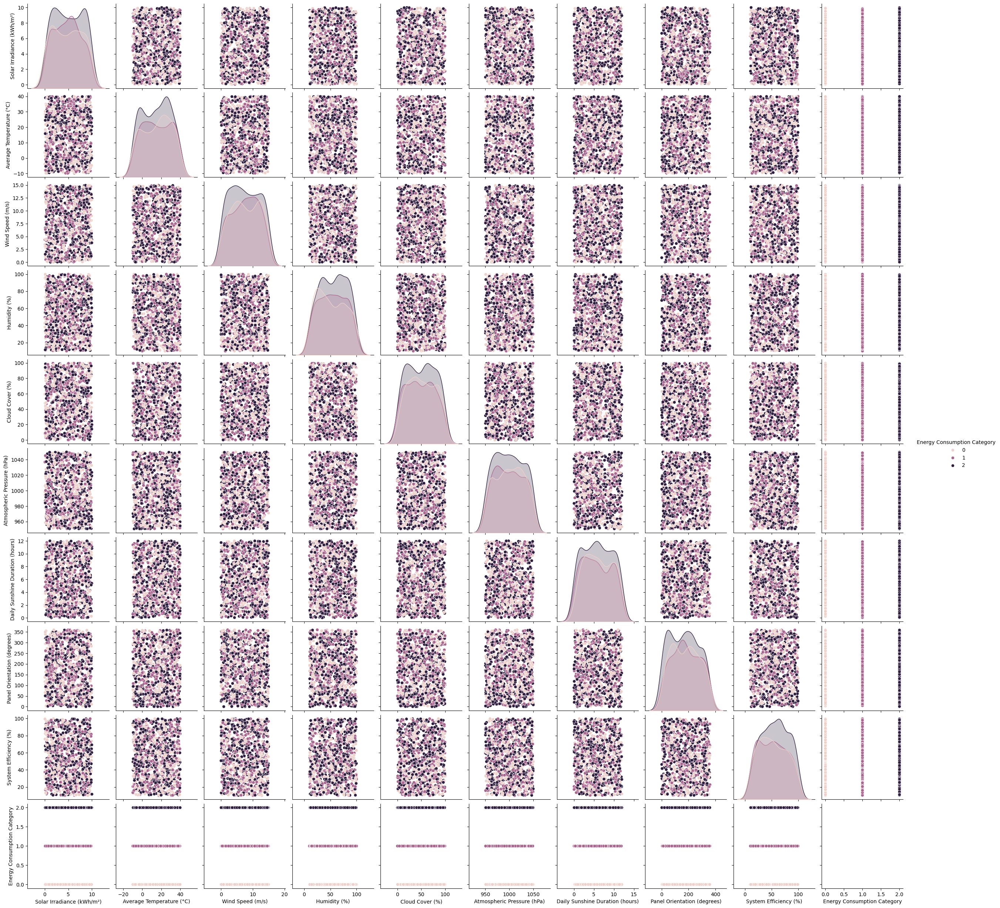

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

df=pd.read_csv('/content/sample_data/Energy_Consumption_Forecasting.csv')
# Assuming num_cols is a list of numerical column names you want to plot
# If you don't have num_cols defined, you might want to select specific columns
# For example: num_cols = ['Solar Irradiance (kWh/m²)', 'Average Temperature (°C)', 'Wind Speed (m/s)']
num_cols = df.select_dtypes(include=np.number).columns.tolist()
sns.pairplot(df, vars=num_cols, hue="Energy Consumption Category")
plt.show()

# Redefine x and y after reloading the dataframe
x=df.drop('Energy Consumption Category',axis=1)
y=df['Energy Consumption Category']

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_Test,y_train,y_Test= train_test_split(x,y,test_size=0.2,random_state=42)

In [ ]:
x_train

,Solar Irradiance (kWh/m²),Average Temperature (°C),Wind Speed (m/s),Humidity (%),Cloud Cover (%),Atmospheric Pressure (hPa),Daily Sunshine Duration (hours),Panel Orientation (degrees),System Efficiency (%),Type of Renewable System
29,0.464504,31.445774,9.812619,66.905394,36.047451,962.130300,1.213987,54.802157,82.548707,Wind
535,9.447657,-3.905695,12.512169,21.671108,58.799163,960.431309,3.004305,252.465603,39.150600,Solar
695,6.106200,-6.591385,7.785484,12.709349,87.991463,980.946258,8.890598,244.124101,64.518354,Solar
557,0.287827,10.551423,4.493485,53.905089,67.906660,1023.592041,0.635231,182.843070,63.433520,Wind
836,9.148459,-3.595213,14.898825,93.929939,37.736318,1038.659544,4.399652,218.051727,55.276149,Wind
...,...,...,...,...,...,...,...,...,...,...
106,4.103829,9.812101,12.857689,75.110304,96.530272,986.679832,5.916362,10.148883,27.868857,Wind
270,8.093612,24.749094,1.563372,32.794515,64.876539,969.267640,4.200082,115.456379,40.822770,Solar
860,7.755276,28.822372,13.001555,83.320390,62.543345,995.539491,0.862881,19.919659,55.516807,Wind
435,7.009691,-8.501321,5.842228,45.030742,28.060081,1023.958118,6.745737,322.828758,32.207268,Wind


In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
y_train

,Energy Consumption Category
29,2
535,1
695,2
557,2
836,0
...,...
106,2
270,2
860,2
435,0


In [ ]:
df_encoded = pd.get_dummies(df)
x=df_encoded.drop("Energy Consumption Category",axis=1)
y=df_encoded["Energy Consumption Category"]

In [ ]:
from sklearn.cluster import KMeans
KMeans = KMeans(n_clusters=3, random_state=42)
df["cluster"] = KMeans.fit_predict(x)

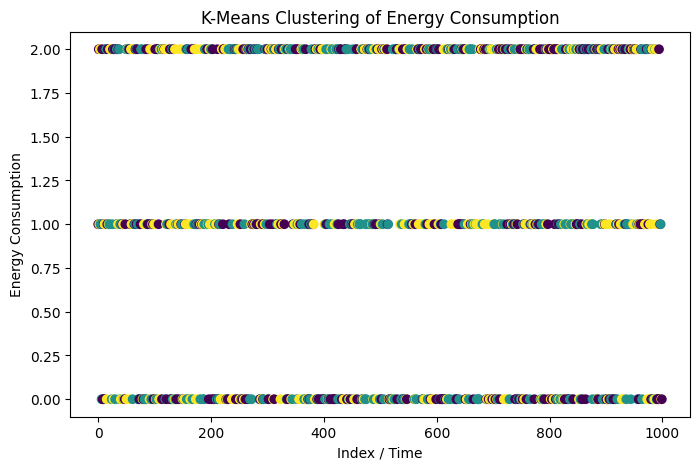

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans

df=pd.read_csv('/content/Energy_Consumption_Forecasting.csv')

# Perform K-Means clustering and add cluster column
x=df.drop("Energy Consumption Category",axis=1)
x_encoded = pd.get_dummies(x) # One-hot encode categorical features
KMeans_model = KMeans(n_clusters=3, random_state=42, n_init=10) # Added n_init for newer sklearn versions
df["cluster"] = KMeans_model.fit_predict(x_encoded)


plt.figure(figsize=(8,5))
plt.scatter(df.index, df["Energy Consumption Category"], c=df["cluster"], cmap="viridis")
plt.xlabel("Index / Time")
plt.ylabel("Energy Consumption")
plt.title("K-Means Clustering of Energy Consumption")
plt.show()